# YOLO_v5s Custom Dataset (3 Classes)

* https://github.com/ultralytics/yolov5

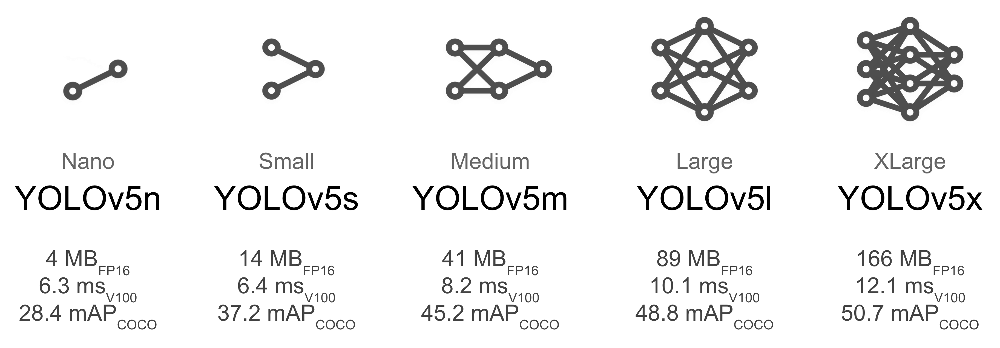

In [1]:
import warnings
warnings.filterwarnings('ignore')

# I. Custom Data_Set

* 3 Classes

>## 1) wget From Github

* 'maskdataset_3C.tar' 파일 다운로드

In [2]:
!wget https://raw.githubusercontent.com/rusita-ai/pyData/master/maskdataset_3C.tara{a,b,c,d,e}

--2023-04-21 05:31:04--  https://raw.githubusercontent.com/rusita-ai/pyData/master/maskdataset_3C.taraa
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 94371840 (90M) [application/octet-stream]
Saving to: ‘maskdataset_3C.taraa’

maskdataset_3C.tara 100%[===================>]  90.00M   180MB/s    in 0.5s    

2023-04-21 05:31:05 (180 MB/s) - ‘maskdataset_3C.taraa’ saved [94371840/94371840]

--2023-04-21 05:31:05--  https://raw.githubusercontent.com/rusita-ai/pyData/master/maskdataset_3C.tarab
Reusing existing connection to raw.githubusercontent.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 94371840 (90M) [application/octet-stream]
Saving to: ‘maskdataset_3C.tarab’

maskdataset_3C.tara 100%[===================>]  90.00M   208MB/s    in 0.4s  

* 현재 작업 경로

In [3]:
%pwd

'/content'

* 다운로드 결과 확인

In [4]:
!ls -l 

total 408156
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.taraa
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.tarab
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.tarac
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.tarad
-rw-r--r-- 1 root root 40448000 Apr 21 05:31 maskdataset_3C.tarae
drwxr-xr-x 1 root root     4096 Apr 19 13:37 sample_data


>## 2) Unzip

In [5]:
!cat maskdataset_3C.tar* | tar xf -

* 실행 결과 확인
 - 'yolo_custom_modeling' 디렉토리 생성

In [6]:
!ls -l

total 408160
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.taraa
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.tarab
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.tarac
-rw-r--r-- 1 root root 94371840 Apr 21 05:31 maskdataset_3C.tarad
-rw-r--r-- 1 root root 40448000 Apr 21 05:31 maskdataset_3C.tarae
drwxr-xr-x 1 root root     4096 Apr 19 13:37 sample_data
drwxr-xr-x 3 root root     4096 Feb  2 02:16 yolo_custom_modeling


# II. Train vs. Test Split

* 현재 작업 경로

In [7]:
!pwd

/content


>## 1) Image Files

In [8]:
# %cd /content/yolo_custom_modeling

from glob import glob

img_list = glob('/content/yolo_custom_modeling/dataset/images/*.png')

print(len(img_list))

843


>## 2) Label Files

In [9]:
from glob import glob

txt_list = glob('/content/yolo_custom_modeling/dataset/labels/*.txt')

print(len(txt_list))

843


>## 3) train_test_split( )

* 8:2

In [10]:
from sklearn.model_selection import train_test_split

train_img_list, valid_img_list = train_test_split(img_list, 
                                                test_size = 0.2, 
                                                random_state = 2045)

print(len(train_img_list), len(valid_img_list))

674 169


* 목록 확인

In [11]:
print('Train_Img: ', train_img_list)
print('Valid_Img: ', valid_img_list)

Train_Img:  ['/content/yolo_custom_modeling/dataset/images/maksssksksss299.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss47.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss828.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss698.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss317.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss791.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss680.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss20.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss838.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss742.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss212.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss387.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss67.png', '/content/yolo_custom_modeling/dataset/images/maksssksksss417.png', '/content/yolo_custom_modeling/dataset

>## 4) Train.txt & Valid.txt 생성

In [12]:
with open('/content/yolo_custom_modeling/dataset/Train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/yolo_custom_modeling/dataset/Valid.txt', 'w') as f:
  f.write('\n'.join(valid_img_list) + '\n')

* 생성 확인

In [13]:
!ls -l /content/yolo_custom_modeling/dataset/*.txt

-rw-r--r-- 1 root root 43725 Apr 21 05:31 /content/yolo_custom_modeling/dataset/Train.txt
-rw-r--r-- 1 root root 10960 Apr 21 05:31 /content/yolo_custom_modeling/dataset/Valid.txt


>## 5) data.yaml 생성

In [14]:
yaml_text = """train: /content/yolo_custom_modeling/dataset/Train.txt
val: /content/yolo_custom_modeling/dataset/Valid.txt

nc: 3
names: ['mask', 'w_mask', 'no_mask']"""

with open('/content/yolo_custom_modeling/dataset/data.yaml', 'w') as file:
    file.write(yaml_text)

* 생성 확인

In [15]:
%cat /content/yolo_custom_modeling/dataset/data.yaml

train: /content/yolo_custom_modeling/dataset/Train.txt
val: /content/yolo_custom_modeling/dataset/Valid.txt

nc: 3
names: ['mask', 'w_mask', 'no_mask']

# III. Yolov5 Configuration

* 작업 경로 설정

In [16]:
%cd /content/yolo_custom_modeling

/content/yolo_custom_modeling


>## 1) Yolo_v5 Clone

In [17]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15553, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (113/113), done.
remote: Total 15553 (delta 65), reused 101 (delta 47), pack-reused 15393
Receiving objects: 100% (15553/15553), 14.59 MiB | 13.22 MiB/s, done.
Resolving deltas: 100% (10593/10593), done.


>## 2) Install Dependencies

In [18]:
%pip install -qr requirements.txt
%pip install -q roboflow

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


>## 3) Configuration Check

In [19]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.0.0+cu118 (Tesla T4)


# IV. Model Learning

* 작업 경로 설정

In [20]:
%cd /content/yolo_custom_modeling/yolov5

/content/yolo_custom_modeling/yolov5


>## 1) YOLO_v5s 

* yolov5s.pt
 - 약 40분

In [21]:
%%time

!python train.py --img 640 --batch 16 --epochs 150 --data /content/yolo_custom_modeling/dataset/data.yaml --weights yolov5s.pt --cache --name mask_yolov5s_results

requirements: YOLOv5 requirement "gitpython" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.0 MB/s eta 0:00:00

requirements: 1 package updated per ['gitpython']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

train: weights=yolov5s.pt, cfg=, data=/content/yolo_custom_modeling/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=mask_yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save

>## 2) View TensorBoard

In [22]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

> ## 3) Object Detection 결과 확인

>### (1) Loss & mAP

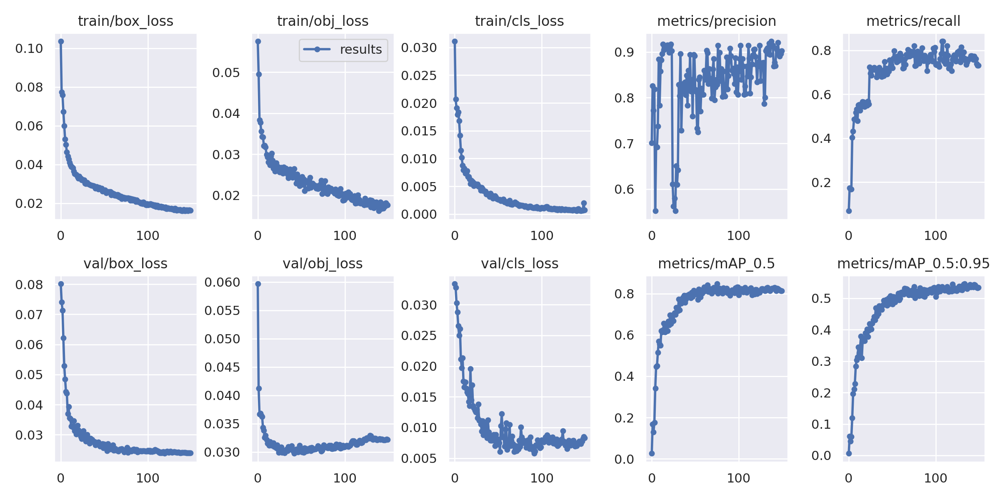

In [23]:
from IPython.display import Image

Image('/content/yolo_custom_modeling/yolov5/runs/train/mask_yolov5s_results/results.png')

>### (2) Training Results Visualization

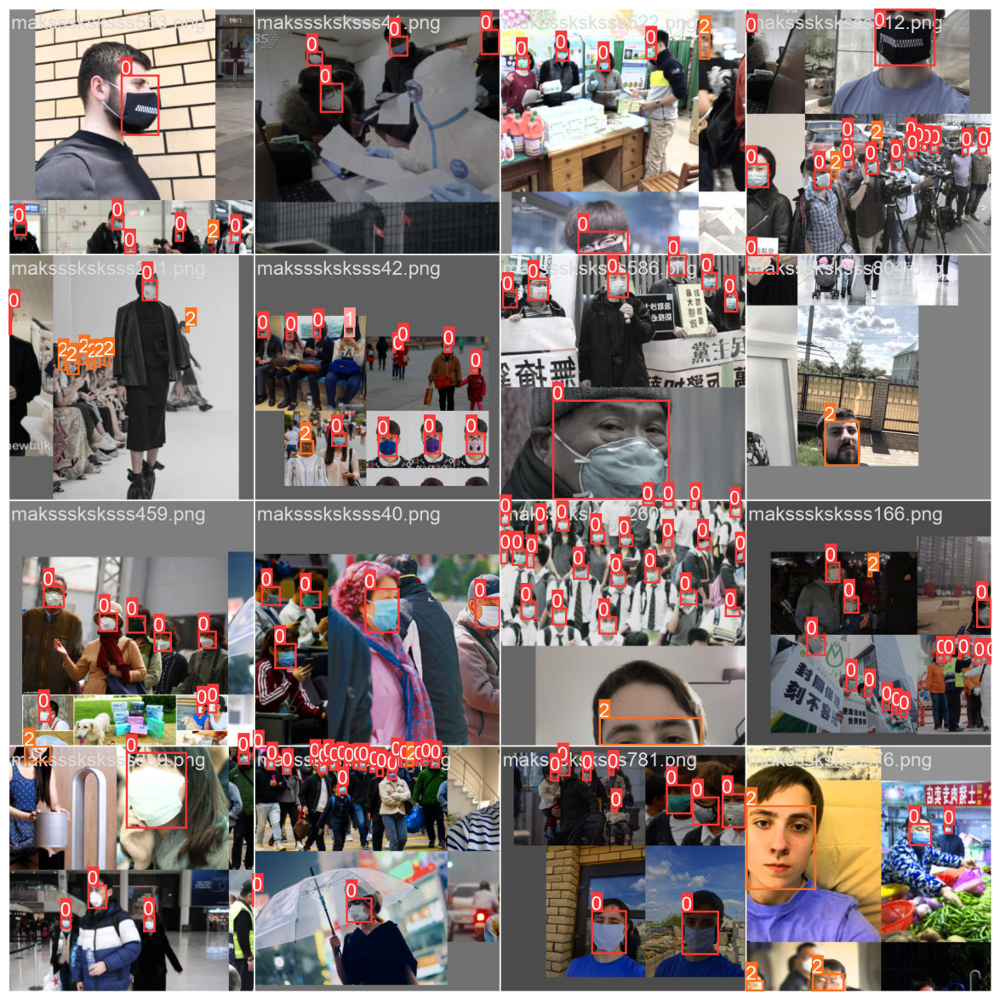

In [24]:
import matplotlib.pyplot as plt

img = plt.imread('/content/yolo_custom_modeling/yolov5/runs/train/mask_yolov5s_results/train_batch0.jpg')
plt.figure(figsize = (20, 15))
plt.imshow(img)
plt.axis('off')
plt.show()

# V. Model Validation

* 현재 작업 경로

In [25]:
!pwd

/content/yolo_custom_modeling/yolov5


>## 1) Validation 데이터에 best.pt 적용

In [26]:
!python val.py --data /content/yolo_custom_modeling/dataset/data.yaml --img 640 --weights /content/yolo_custom_modeling/yolov5/runs/train/mask_yolov5s_results/weights/best.pt

val: data=/content/yolo_custom_modeling/dataset/data.yaml, weights=['/content/yolo_custom_modeling/yolov5/runs/train/mask_yolov5s_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/yolo_custom_modeling/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients
val: Scanning /content/yolo_custom_modeling/dataset/Valid.cache... 169 images, 0 backgrounds, 0 corrupt: 100% 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 6/6 [00:14<00:00,  2.34s/it]
                   all        169       1076    

# VI. Model Test

>## 1) Test Directory
 * --source /content/yolo_custom_modeling/dataset/test

In [27]:
# !python detect.py --source /content/yolo_custom_modeling/dataset/test --img 640 --weight /content/yolo_custom_modeling/yolov5/runs/train/mask_yolov5s_results/weights/best.pt --conf 0.5 --name Mask_Test_Image

>## 2) Results Visualization

In [28]:
#display inference on ALL test images

# import glob
# from IPython.display import Image, display

# for imageName in glob.glob('/content/yolo_custom_modeling/yolov5/runs/detect/Mask_Test_Image/*.png'): #assuming JPG
#     display(Image(filename=imageName))
#     print("\n")

# VII. Save Model to Google Drive

>## 1) Mount Google Drive

In [29]:
# from google.colab import drive
# drive.mount('/content/drive')

>## 2) Model Copy to Google Drive

In [30]:
# cp -r /content/yolov5/runs/train/mask_yolov5s_results /content/drive/MyDrive/Mask_yolov5

# 
# 
# 
# The End
# 
# 
# 